In [1]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

import astropy
from astropy.io import fits
from astropy.visualization import ImageNormalize, MinMaxInterval, PercentileInterval, SimpleNorm, AsinhStretch, hist, AsymmetricPercentileInterval
from astropy.stats import sigma_clipped_stats, mad_std, sigma_clip, SigmaClip, freedman_bin_width, knuth_bin_width, bayesian_blocks
from astropy.convolution import TrapezoidDisk2DKernel, Tophat2DKernel, Gaussian2DKernel, convolve

from photutils.background import Background2D, MedianBackground, MADStdBackgroundRMS, SExtractorBackground, ModeEstimatorBackground
from photutils.segmentation import detect_sources, detect_threshold
from photutils.detection import DAOStarFinder
from photutils.aperture import CircularAperture, EllipticalAperture, ApertureMask

import skimage as ski
from skimage.segmentation import active_contour
from skimage.measure import regionprops
from skimage.exposure import rescale_intensity

In [2]:
fits_path = Path.cwd()/Path('M51.fits')
#open fits file
hdulist= fits.open(fits_path)
hdulist.info()
headers = fits.getheader(fits_path)
hdulist.close()
    

Filename: c:\Users\jfmag\OneDrive\Documentos\Maestria\Proyecto integrador\M51.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     161   (891, 893)   int16   
  1  xp.mask       1 TableHDU        25   1600R x 4C   [F6.2, F6.2, F6.2, F6.2]   


In [3]:
image_data= fits.getdata(fits_path)
print(image_data)

[[4089 4339 4589 ... 4419 4419 4419]
 [4089 4089 4339 ... 4419 4419 4419]
 [4339 4339 4339 ... 4544 4794 4544]
 ...
 [4411 4661 5161 ... 4392 4392 4392]
 [4411 4661 4661 ... 4392 4642 4642]
 [4349 4599 4349 ... 4705 4580 4580]]


In [4]:
image_data.shape

(893, 891)

In [5]:
print('Valores image_data:')
print(f'Min: {np.min(image_data)}\nMax: {np.max(image_data)}\nMean: {np.mean(image_data)} \nDesv. Est: {np.std(image_data)} \nMedian: {np.median(image_data)}')

Valores image_data:
Min: 1817
Max: 28712
Mean: 6171.174543745279 
Desv. Est: 3303.3683646541617 
Median: 4756.0


(np.float64(-0.5), np.float64(890.5), np.float64(-0.5), np.float64(892.5))

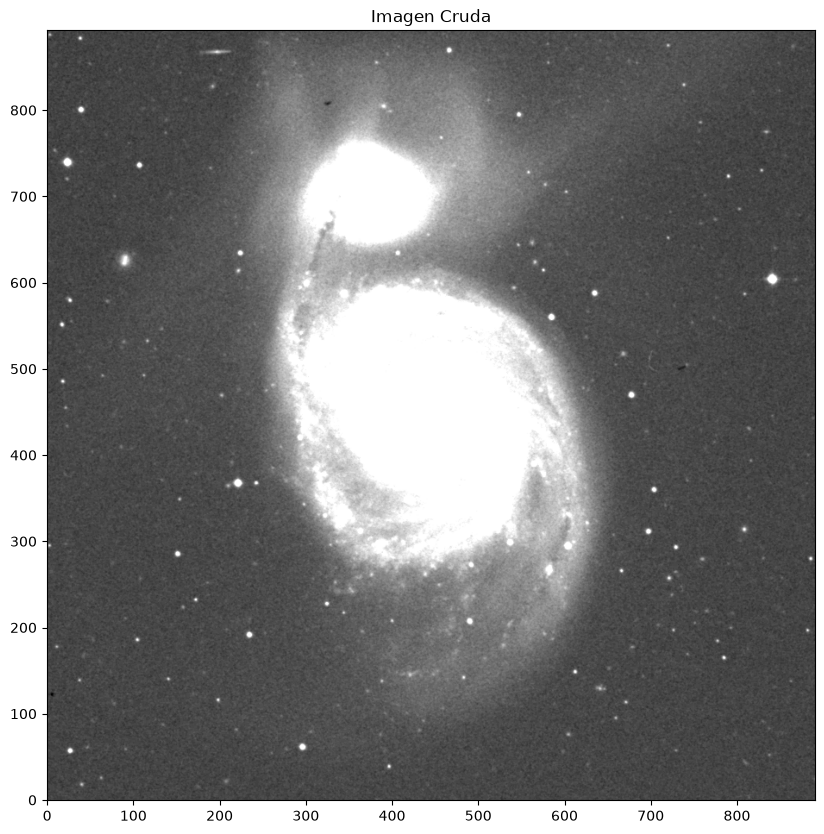

In [6]:
luz= np.nanmedian(image_data) + np.nanstd(image_data)*2
gal_img = plt.figure(figsize=(15,10)).add_subplot()
gal_img.imshow(image_data, vmin=np.min(image_data), vmax=luz, cmap="gray", origin='lower')
gal_img.set_title('Imagen Cruda')
gal_img.axis('on')


***Análisis estadístico - EDA***

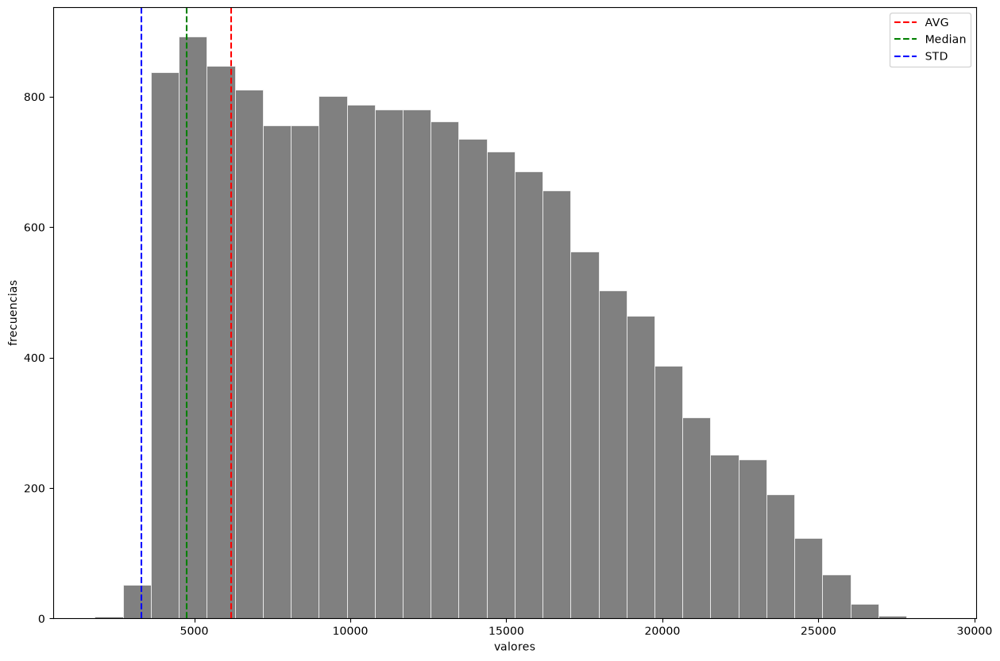

In [7]:
valores, frecuencias = np.unique(image_data, return_counts=True)
ax = plt.figure(figsize=(15,10)).add_subplot(xlabel="valores", ylabel='frecuencias')
ax.hist(valores, bins=30, linewidth =0.5, edgecolor='white',color='gray')
ax.axvline(np.mean(image_data), ls='--', color='r').set_label('AVG')
ax.axvline(np.median(image_data), ls='--', color='g').set_label('Median')
ax.axvline(np.std(image_data), ls='--', color='b').set_label('STD')
ax.legend()

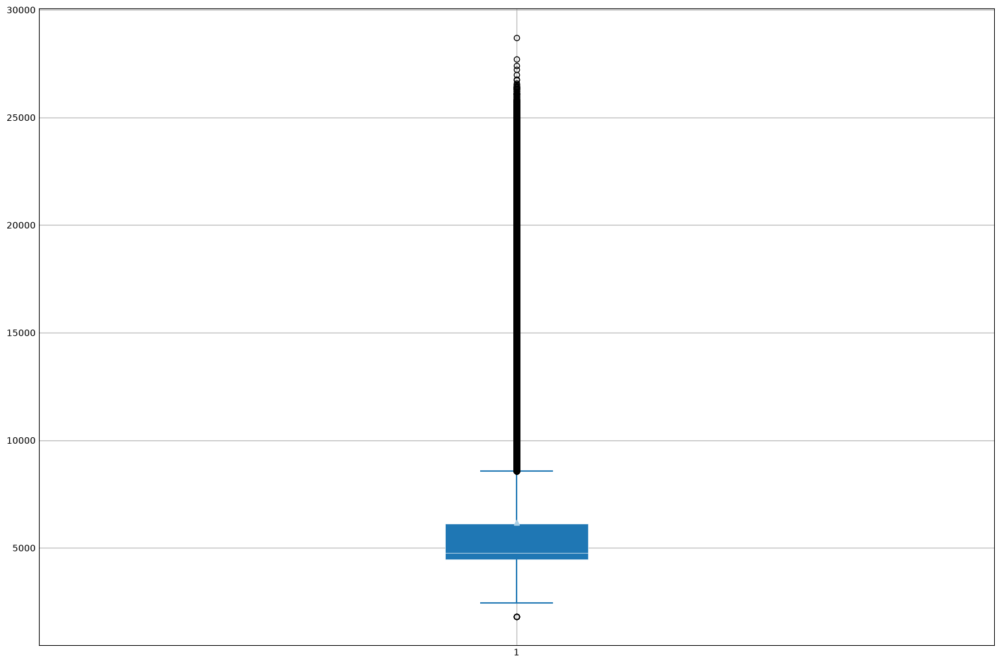

In [8]:
plt.style.use('_mpl-gallery')
ax = plt.figure(figsize=(15,10)).add_subplot()
VP = ax.boxplot(image_data.ravel(), patch_artist=True,
    showmeans=True, showfliers=True,
    medianprops={"color": "white", "linewidth": 0.5},
    boxprops={"facecolor": "C0", "edgecolor": "white",
  "linewidth": 0.5},
    whiskerprops={"color": "C0", "linewidth": 1.5},
    capprops={"color": "C0", "linewidth": 1.5})


In [9]:
# VP es la variable donde guardaste el gráfico: VP = ax.boxplot(...)
# Obtenemos los valores del eje Y de los puntos atípicos
outliers = VP['fliers'][0].get_ydata()
print(outliers)

[1817 1817 1817 ... 8630 9161 9474]


In [10]:
# Filtramos para eliminar los píxeles muertos de 1817
# y nos quedamos solo con la densa nube de arriba (> 6500)
outliers_superiores = outliers[outliers > 6500]

# El mínimo de este grupo es el verdadero inicio de la galaxia
verdadero_inicio = outliers_superiores.min()
print("El inicio exacto de la galaxia es:", verdadero_inicio)


El inicio exacto de la galaxia es: 8584


***Tipos de bins para histogramas***

1. Regla de Freedman-Diaconis:
- Calcula el ancho de las barras basándose en el rango intercuartílico (IQR) y el número total de datos.
- Altamente robusto a los datos atípicos (outliers).
2. Regla de Scott:
- Calcula el ancho de barra basándose en la desviación estándar de los datos en lugar del IQR.
- Es matemáticamente óptimo si tus datos siguen una distribución normal perfecta (curva de campana).
3. Regla de Knuth:
- **No asume una forma para tus datos.** optimización bayesiana para probar múltiples números de barras fijos y calcula cuál de ellos tiene la máxima probabilidad (verosimilitud) de representar la densidad real del fenómeno estudiado.
- Encuentra el "punto dulce" óptimo de barras uniformes sin importar si la **distribución es rara, sesgada o bimodal**.
4. Bloques Bayesianos:
- **No usa un ancho fijo para todas las barras.** Utiliza programación dinámica bayesiana para encontrar dónde cambian drásticamente las frecuencias de los datos y dibuja barras anchas donde hay pocos datos y barras muy finas donde hay muchos datos acumulados.
- Adapta el gráfico dinámicamente a la densidad local. Evita que las zonas vacías se llenen de barras en cero y resalta con extrema precisión los picos de datos.
- Es el estándar de oro en astrofísica y análisis de series de tiempo.

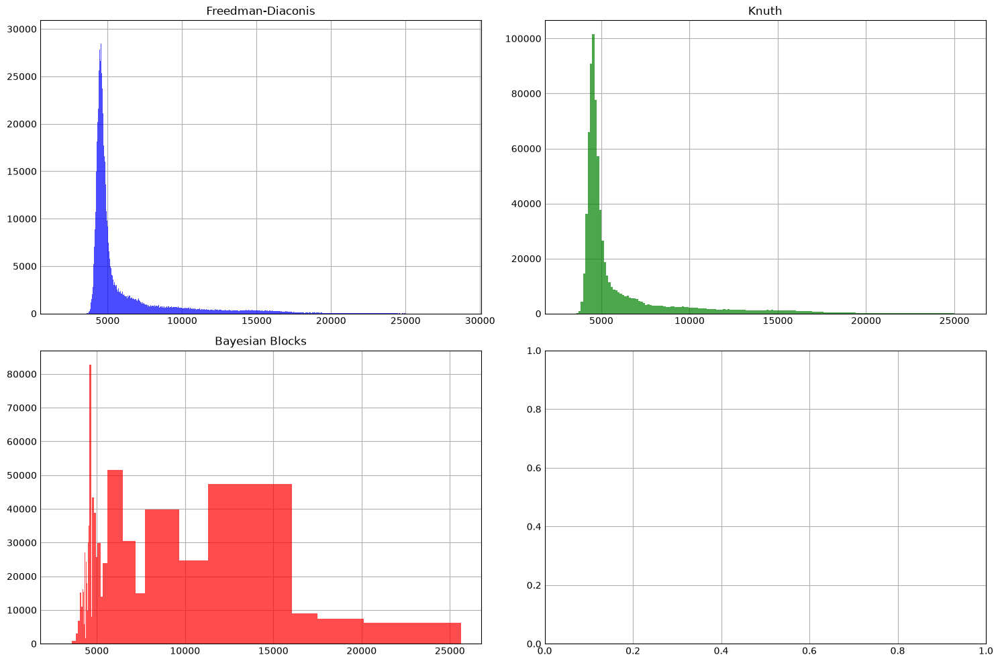

In [11]:
galaxia_plana = image_data.ravel()

#son muchos datos...entonces saco una muestra
if len(galaxia_plana) > 15000:
    muestra = np.random.choice(galaxia_plana, size=15000, replace=False)
else:
    muestra = galaxia_plana

_, freedman = freedman_bin_width(galaxia_plana, return_bins=True)
_, knuth = knuth_bin_width(muestra, return_bins=True)
blocks = bayesian_blocks(muestra) 

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15,10))
axs[0,0].hist(galaxia_plana, bins=freedman, color='blue', alpha=0.7)
axs[0,0].set_title('Freedman-Diaconis')
axs[0,1].hist(galaxia_plana, bins=knuth, color='green', alpha=0.7)
axs[0,1].set_title('Knuth')
axs[1,0].hist(galaxia_plana, bins=blocks, color='red', alpha=0.7)
axs[1,0].set_title('Bayesian Blocks')

plt.tight_layout()
plt.show()

***Descripción del pipeline para máscaras***

1. Efecto cartulina negra:
    - 1.1. Cálculo las métricas del cielo astrónimco
    - 1.2 Restar el cielo astronómico a la imagen
    - 1.3 Hacer un "escudo" para la galaxia
    - 1.5 Normalizar la imagen para "desaturar" los valores de los bulbos
    - 1.6 Limpiar el fondo de las estrellas que no son parte de las galaxias

2. Obtener la máscara
    - 2.1 Medir hasta dónde llega la luz, esto incluye el halo (algoritmo: Region Growing)
    - 2.2 Dibujar la silueta de la galaxia (algoritmo: Active Contours)

***Librerías a ocupar***

- Astrofísica y Fondos: astropy.stats.Background2D y astropy.visualization.ImageNormalize con AsinhStretch.
- Remoción de Estrellas: photutils.detection.DAOStarFinder para automatizar el "apagado" de fuentes espurias puntuales.
- Segmentación Avanzada: skimage.segmentation.watershed (o flood_fill) acoplado con skimage.segmentation.active_contour.
- Generación del Target: skimage.draw.polygon2mask

In [12]:
#Métricas del cielo astronómico
stats_clp = sigma_clipped_stats(data=image_data,sigma=3.5, maxiters=10)
mad = mad_std(image_data)
print(f'Stas Sgima;\nAvg:{stats_clp[0]}\nMedian:{stats_clp[1]}\nStd:{stats_clp[2]}\nMAD:{mad}')

Stas Sgima;
Avg:4781.7308491010535
Median:4617.0
Std:580.4434877963714
MAD:598.9712962762633


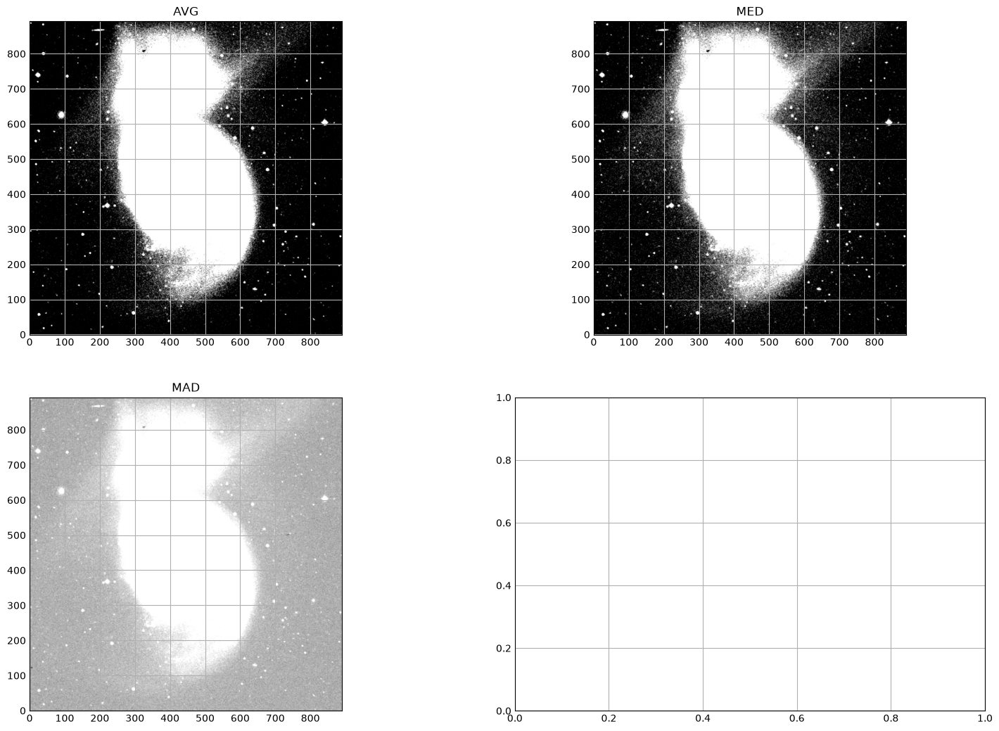

In [13]:
#gráficas de cómo se ve la galaxia vs el cielo
fig, axs = plt.subplots(nrows=2,ncols=2,figsize=(15,10))
axs[0,0].imshow(image_data, vmin=stats_clp[0], vmax=np.mean(image_data), cmap="gray", origin='lower')
axs[0,0].set_title('AVG')
axs[0,1].imshow(image_data, vmin=stats_clp[1], vmax=np.mean(image_data), cmap="gray", origin='lower')
axs[0,1].set_title('MED')
axs[1,0].imshow(image_data, vmin=mad, vmax=np.mean(image_data), cmap="gray", origin='lower')
axs[1,0].set_title('MAD')

plt.show()


***Corrección del "hoyo" debido a un box_size y filter_size bajo***

1. El Cálculo Matemático de box_size (Tamaño de la Malla): La regla de oro en astrofísica observacional dicta que el tamaño de **la caja de fondo debe ser sustancialmente mayor que la escala espacial de la fuente extendida más grande de la imagen** (en este caso, el diámetro mayor de tu galaxia objetivo), pero lo suficientemente pequeña como para capturar los gradientes reales de la contaminación lumínica del cielo.Para automatizarlo en una muestra masiva, se calculan las dimensiones geométricas del lienzo en píxeles (N_x X N_y) utilizando las propiedades de la matriz o los metadatos **NAXIS1 y NAXIS2** de tu Header.
- La Ecuación de Escala: Para imágenes centradas y recortadas de colecciones como el SDSS o HST, una métrica matemática sumamente robusta es definir el tamaño de la caja entre el 15% y el 25% del tamaño total del eje del lienzo:

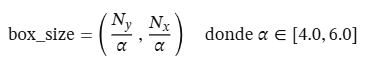

- Al configurar box_size=(178, 178), obligas matemáticamente a que cualquier celda que toque los extremos de los brazos espirales de M51 abarque un volumen masivo de cielo real en las periferias. El Sigma Clipping bidimensional integrado detectará el flujo de la galaxia como un valor atípico (outlier) y lo descartará, calculando el fondo real de manera impecable.

2. El Cálculo Matemático de filter_size (Filtro de Suavizado): El parámetro filter_size determina la ventana del filtro de paso bajo (mediana o media) que se desliza sobre la matriz de baja resolución generada por las cajas antes de realizar la interpolación final por splines. Su propósito es diluir cualquier residuo de alta frecuencia que se haya escapado del paso anterior.
- La Regla de Proporción: Para evitar introducir artefactos visuales o deformar la pendiente real del cielo, el tamaño del filtro debe ser un número entero impar y guardar una proporción matemática directa con el número de cajas que caben en el lienzo.
- La Ecuación de Diseño: Se recomienda que el filtro abarque entre el 3% y el 5% del número de píxeles totales del lienzo, expresado de la siguiente manera:

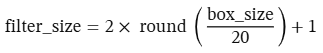

- Nota: revisar las imágenes del folder: https://1drv.ms/f/c/4c02d413eddd1231/IgCNYB0pxnvKQ686BuPhjw4aAQl9nDffEOJTBEFk9GscCWc?e=vvDqxc

In [14]:
#cálculo del filtro y del box
bxX = headers['naxis1']
bxY = headers['naxis2']
alpha_bx = np.arange(4,6.2,0.2)
print(alpha_bx)
print(bxX, bxY)

[4.  4.2 4.4 4.6 4.8 5.  5.2 5.4 5.6 5.8 6. ]
891 893


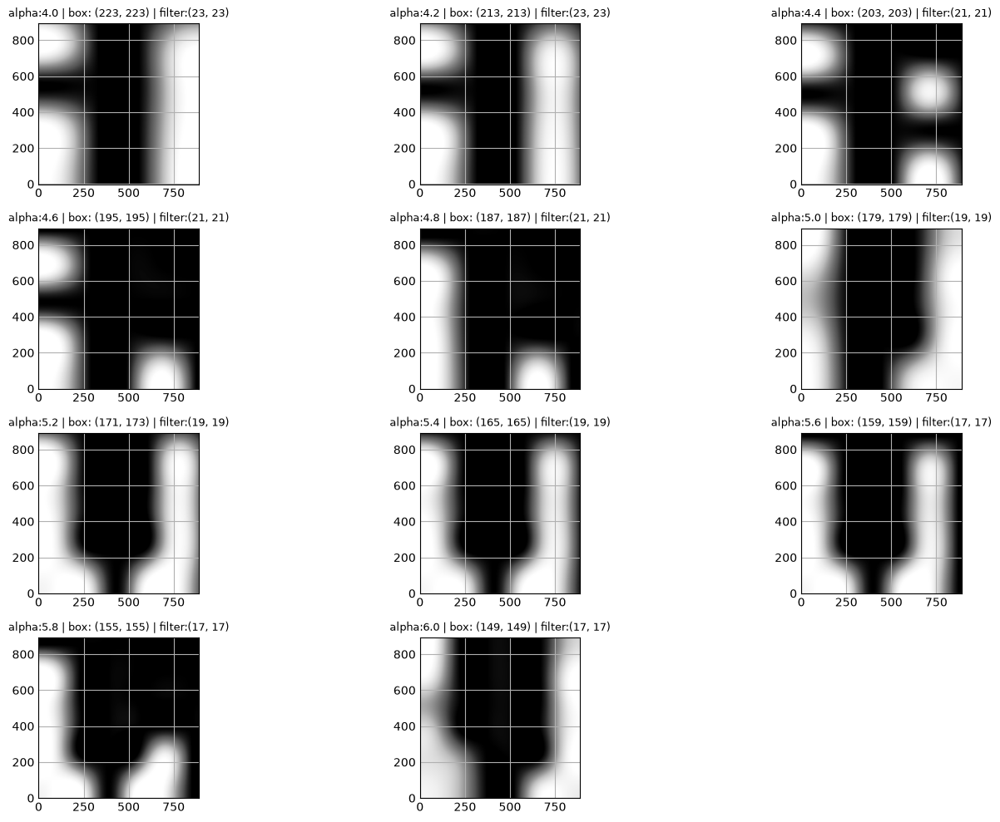

In [15]:
sc = SigmaClip(sigma=3.0)
back_median = MedianBackground(sigma_clip=sc)
bkg_val = back_median(image_data)

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 10))
axs = axs.ravel()

for idx, i in enumerate(alpha_bx):
    if idx >= len(axs): 
        break
        
    ax = axs[idx]
    
    boxszX = int(np.round(bxX / i, 0))
    boxszY = int(np.round(bxY / i, 0))
    filterX = int(np.round(2 * (boxszX / 20) + 1, 0))
    filterY = int(np.round(2 * (boxszY / 20) + 1, 0))
    
    if boxszX % 2 == 0: boxszX += 1
    if boxszY % 2 == 0: boxszY += 1
    if filterX % 2 == 0: filterX += 1
    if filterY % 2 == 0: filterY += 1
    
    bkg = Background2D(image_data, box_size=(boxszX, boxszY), filter_size=(filterX, filterY), sigma_clip=sc, bkg_estimator=back_median, filter_threshold=stats_clp[1])
    
    ax.imshow(bkg.background, origin='lower', cmap='Greys') 
    ax.set_title(f'alpha:{round(i,1)} | box: {boxszX, boxszY} | filter:{filterX, filterY}', fontsize=9)

for j in range(len(alpha_bx), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


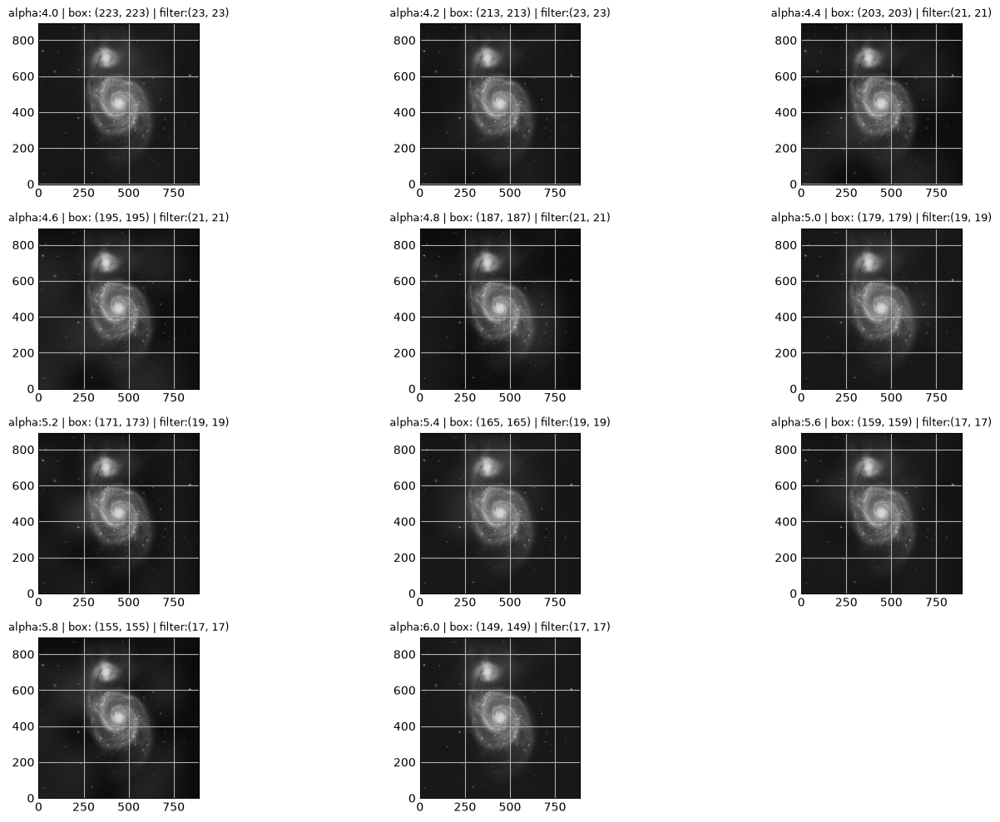

In [16]:
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 10))
axs = axs.ravel()
sextbkg = SExtractorBackground(sigma_clip=sc)
modebkg = ModeEstimatorBackground(sigma_clip=sc)
for idx, i in enumerate(alpha_bx):
    if idx >= len(axs): 
        break
        
    ax = axs[idx]
    
    boxszX = int(np.round(bxX / i, 0))
    boxszY = int(np.round(bxY / i, 0))
    filterX = int(np.round(2 * (boxszX / 20) + 1, 0))
    filterY = int(np.round(2 * (boxszY / 20) + 1, 0))
    
    if boxszX % 2 == 0: boxszX += 1
    if boxszY % 2 == 0: boxszY += 1
    if filterX % 2 == 0: filterX += 1
    if filterY % 2 == 0: filterY += 1
    
    bkg = Background2D(image_data, box_size=(boxszX, boxszY), filter_size=(filterX, filterY), sigma_clip=sc, bkg_estimator=modebkg, filter_threshold=stats_clp[1])
    arr_cielo_med = image_data-bkg.background

    ax.imshow(arr_cielo_med, vmin=np.min(arr_cielo_med),vmax=np.max(arr_cielo_med), origin='lower', cmap='grey') 
    ax.set_title(f'alpha:{round(i,1)} | box: {boxszX, boxszY} | filter:{filterX, filterY}', fontsize=9)

for j in range(len(alpha_bx), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()
    

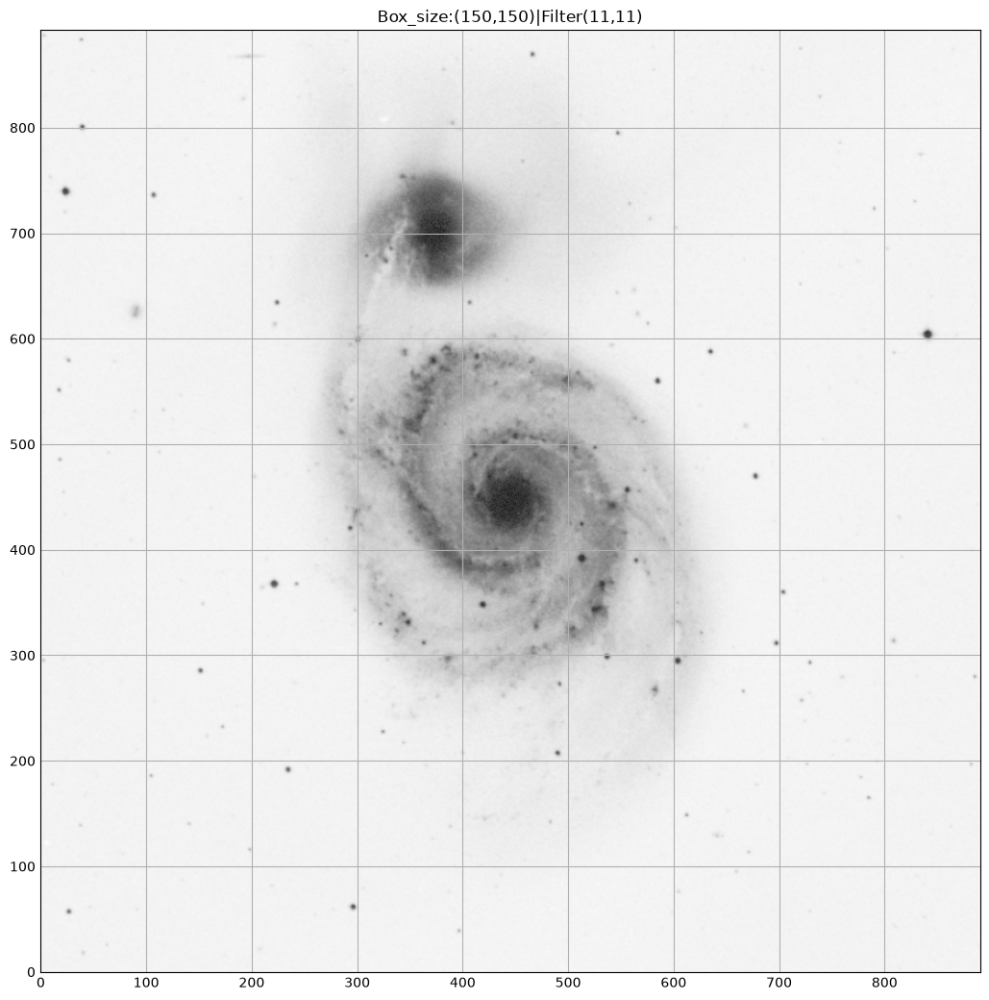

In [17]:
#resta del cielo astronómico al array original
bkg = Background2D(image_data, box_size=(150,150), filter_size=(11,11), sigma_clip=sc, bkg_estimator=back_median, filter_threshold=stats_clp[1])
arr_cielo_med = image_data-bkg.background
#grafica del cielo astronómico
ax =  plt.figure(figsize=(10,10)).add_subplot(title = 'Box_size:(150,150)|Filter(11,11)')
ax.imshow(arr_cielo_med, vmin=np.min(arr_cielo_med),vmax=np.max(arr_cielo_med), origin='lower', cmap="Greys")

plt.show()

**Normalización de la imágen**

***Métodos para descubrir el valor de alpha***
1. Metodología 1: Basada en el Ruido del Fondo (Criterio de Lupton)
- El factor a debe configurarse para que el ruido de fondo permanezca estrictamente en la región lineal del mapeo, evitando que las fluctuaciones estadísticas se estiren exponencialmente y confundan a la UNet.
- Cálculo Físico del Umbral de Ruido: Mide la desviación estándar del fondo (con Sigma Clipping) sobre la matriz original. Luego, normaliza ese valor aplicando exactamente la misma transformación de intervalo (PercentileInterval o limites *v_min, v_max* que usará tu pipeline.
- Fórmula:

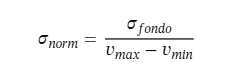

2. Criterio Estándar: 
- Se establece que la transición lineal-logarítmica ocurra a una distancia de 1σ a 3σ del ruido de fondo normalizado
- Fórmula:

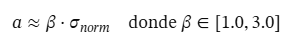

3. El Enfoque Empírico-Estadístico (Fracción del Rango Dinámico)
- Si deseas que la UNet visualice de forma equilibrada tanto el bulbo como la estructura helicoidal en una colección masiva, puedes calcular a basándote en la dispersión interna de la galaxia.
    - Extrae los percentiles reales de la matriz de flujo una vez removidos los NaNs.
    - Calcula la distancia asimétrica entre la mediana del fondo (P₅₀ o t_med) y el inicio del bulbo central (por ejemplo, el percentil 95, P₉₅).
    - Define a como la fracción que representa esa transición respecto al rango total mapeado (v_max - v_min).
- Fórmula:

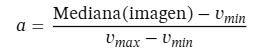

In [18]:
#valor de alpha con el método estadístico
avg_cielo, med_cielo, std_cielo = sigma_clipped_stats(arr_cielo_med, sigma=3, maxiters=10)
denominador = np.max(arr_cielo_med)-np.min(arr_cielo_med)
alpha_lupton= std_cielo/denominador
alpha_lest = std_cielo*3
alpha_est = (med_cielo-np.min(arr_cielo_med))/denominador

In [19]:
#instancio los tipo de normalización
minmax = MinMaxInterval()
itqr = PercentileInterval(percentile=98)
aprint = AsymmetricPercentileInterval(lower_percentile=1, upper_percentile=98)
asin_lupton = AsinhStretch(a=alpha_lupton)
asin_lest = AsinhStretch(a=alpha_lest)
asin_est = AsinhStretch(a=alpha_est)


In [20]:
#normalización con lupton
norm_minmax_lupton = ImageNormalize(data=arr_cielo_med,interval=minmax, stretch=asin_lupton)
norm_percent_lupton = ImageNormalize(data=arr_cielo_med,interval=itqr, stretch=asin_lupton)
norm_aprint_lupton = ImageNormalize(data=arr_cielo_med,interval=aprint, stretch=asin_lupton)
#normalización con lupton estándar
norm_minmax_lest = ImageNormalize(data=arr_cielo_med,interval=minmax, stretch=asin_lest)
norm_percent_lest = ImageNormalize(data=arr_cielo_med,interval=itqr, stretch=asin_lest)
norm_aprint_lest = ImageNormalize(data=arr_cielo_med,interval=aprint, stretch=asin_lest)
#normalización con estadítico
norm_minmax_est = ImageNormalize(data=arr_cielo_med,interval=minmax, stretch=asin_est)
norm_percent_est = ImageNormalize(data=arr_cielo_med,interval=itqr, stretch=asin_est)
norm_aprint_est = ImageNormalize(data=arr_cielo_med,interval=aprint, stretch=asin_est)

Text(0.5, 1.0, 'Asymmetric Percentile Interval - Estadística')

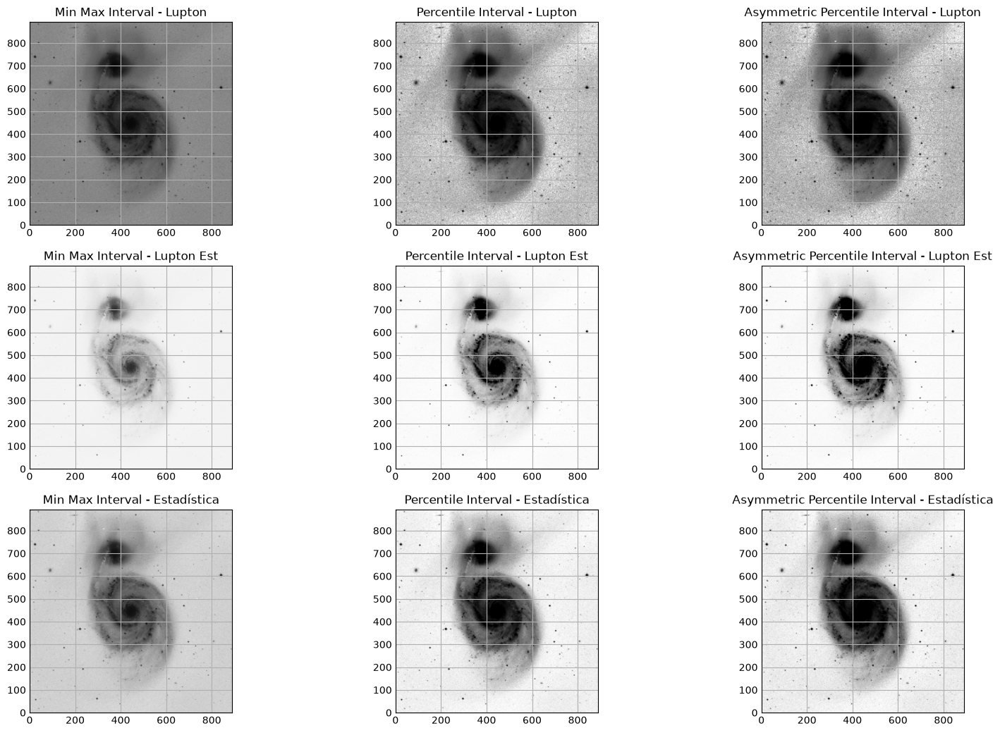

In [21]:
fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(15,10))
axs[0,0].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm= norm_minmax_lupton)
axs[0,0].set_title('Min Max Interval - Lupton')
axs[0,1].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm = norm_percent_lupton)
axs[0,1].set_title('Percentile Interval - Lupton')
axs[0,2].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm = norm_aprint_lupton)
axs[0,2].set_title('Asymmetric Percentile Interval - Lupton')
axs[1,0].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm= norm_minmax_lest)
axs[1,0].set_title('Min Max Interval - Lupton Est')
axs[1,1].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm = norm_percent_lest)
axs[1,1].set_title('Percentile Interval - Lupton Est')
axs[1,2].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm = norm_aprint_lest)
axs[1,2].set_title('Asymmetric Percentile Interval - Lupton Est')
axs[2,0].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm= norm_minmax_est)
axs[2,0].set_title('Min Max Interval - Estadística')
axs[2,1].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm = norm_percent_est)
axs[2,1].set_title('Percentile Interval - Estadística')
axs[2,2].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm = norm_aprint_est)
axs[2,2].set_title('Asymmetric Percentile Interval - Estadística')

In [22]:
headers

SIMPLE  =                    T /FITS: Compliance                                
BITPIX  =                   16 /FITS: I*2 Data                                  
NAXIS   =                    2 /FITS: 2-D Image Data                            
NAXIS1  =                  891 /FITS: X Dimension                               
NAXIS2  =                  893 /FITS: Y Dimension                               
EXTEND  =                    T /FITS: File can contain extensions               
DATE    = '2026-08-25        '  /FITS: Creation Date                            
ORIGIN  = 'STScI/MAST'         /GSSS: STScI Digitized Sky Survey                
SURVEY  = 'POSSII-F'           /GSSS: Sky Survey                                
REGION  = 'XP270   '           /GSSS: Region Name                               
PLATEID = 'A1CS    '           /GSSS: Plate ID                                  
SCANNUM = '01      '           /GSSS: Scan Number                               
DSCNDNUM= '00      '        

**Cálculo del FWHM de la imágen**

- Seeing atmosférico o la óptica del telescopio, medido como el FWHM (Full Width at Half Maximum) en píxeles.
- Header de tu FITS del SDSS y encuentras el FWHM típico de la observación (o si mides el ancho de una estrella periférica promedio), puedes convertir ese FWHM a la desviación estándar geométrica exacta mediante la constante analítica de la distribución gaussiana:

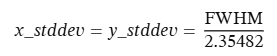

- detect_sources no rompa los brazos de la galaxia en pedazos aislados, puedes tratar a x_stddev como un hiperparámetro de suavizado espacial:
    - Se busca un kernel isotrópico (circular perfecto), por lo que siempre debes asignar exactamente el mismo valor a ambos ejes: x_stddev = y_stddev
    - *Valor estandarizado* en la literatura 1.5 y 2.0 píxeles
    - kernel de aproximadamente (13X13) o (17X17) píxeles que difumina lo suficiente los brazos para soldar sus "islas" sin deformar el bulbo

Debido a que no tengo en los header el valor de FWHM, entocnes procedo a calcularlo de la siguietne manera:
1. Tomo XPIXELSZ y YPIXLSZ y los divido a cada uno entre 1000 y el cosciente lo multiplico por PLTSCALE, el fundamento es tener todo en milímetros y multiplicarlos por el factor de arcos por segundo que registra la placa.
2. El límite físico impuesto por la atmósfera (Seeing) y la emulsión química promedia un FWHM de 2.0 a 3.0 segundos de arco en el cielo. Se toma un estándar de 2.5".
3. se toma la constante de 2.35482 ya que esta define la relación entre FWHM y la desviación estándar de una campana de Gauss.


***Justificación ***
- Justificación Física (Astrofísica): Derivado de la escala de placa de 67.20''/mm y el muestreo del escáner de ≈ 15 μ m, la resolución es de 1.01''/pixel. Asumiendo el Seeing medio histórico de las placas POSS-II de 2.5'', el filtro adaptado gaussiano ideal exige x_stddev=1.05 y y_stddev=1.05.
- Justificación por Ingeniería de Características (IA) - Nuestra sugerencia prácica: Dado que el objetivo primordial del Paso C es el sobre-suavizado morfológico para "soldar" los brazos espirales rotos por el grano fotográfico de la placa química, se optó por un hiperparámetro ampliado de x_stddev=2.0 y y_stddev=2.0. Esto duplica el FWHM físico del telescopio, actuando como un difuminador intencional que garantiza la unión estructural del escudo galáctico.

In [23]:
#genero lo parámetros delos kernels
xpx= (headers['XPIXELSZ']/1000)*headers['PLTSCALE']
ypx = (headers['YPIXELSZ']/1000)*headers['PLTSCALE']
xstd = ((2.5/xpx)/2.35482)
ystd=((2.5/ypx)/2.35482)
rxstd = np.ceil(xstd)
rystd= np.ceil(ystd)
print(rxstd,rystd)

2.0 2.0


Text(0.5, 1.0, 'Tophat2DKernel')

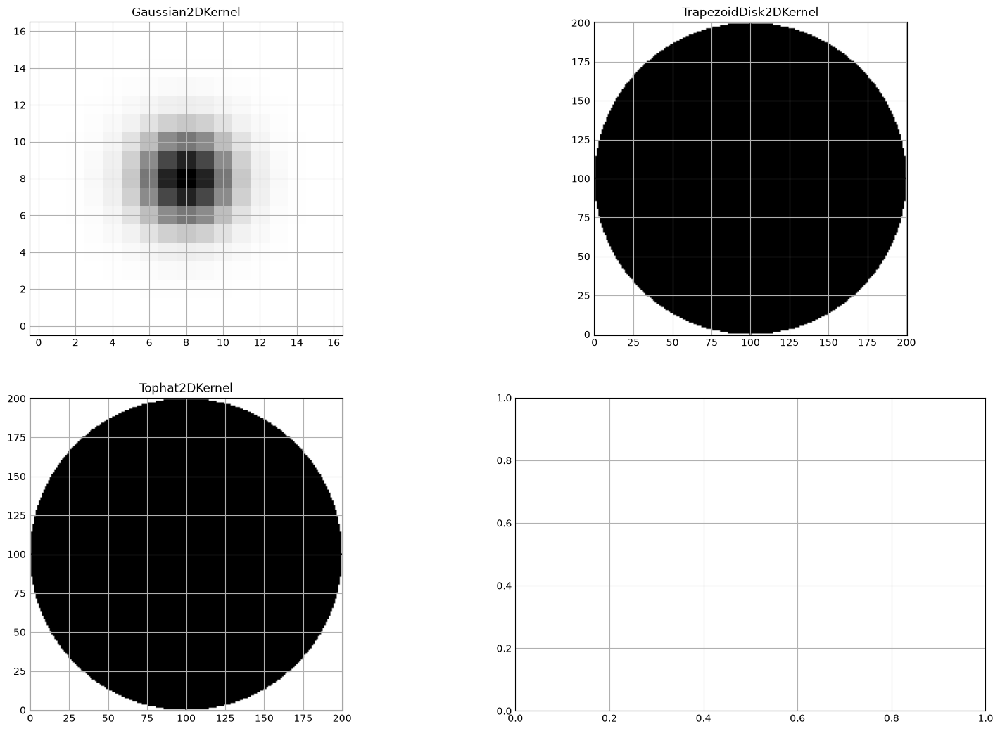

In [24]:
#instancio los Kernels
g2dK=Gaussian2DKernel(x_stddev=rxstd, y_stddev=rystd)
TD2dK= TrapezoidDisk2DKernel(radius=100,slope=med_cielo)
T2dK= Tophat2DKernel(radius=100)
#grafico cómo se ven los kernels
fig, axs = plt.subplots(nrows=2,ncols=2,figsize=(15,10))
axs[0,0].imshow(g2dK, origin='lower', cmap="Greys")
axs[0,0].set_title('Gaussian2DKernel')
axs[0,1].imshow(TD2dK, origin='lower', cmap="Greys")
axs[0,1].set_title('TrapezoidDisk2DKernel')
axs[1,0].imshow(T2dK, origin='lower', cmap="Greys")
axs[1,0].set_title('Tophat2DKernel')

Text(0.5, 1.0, 'Tophat2DKernel')

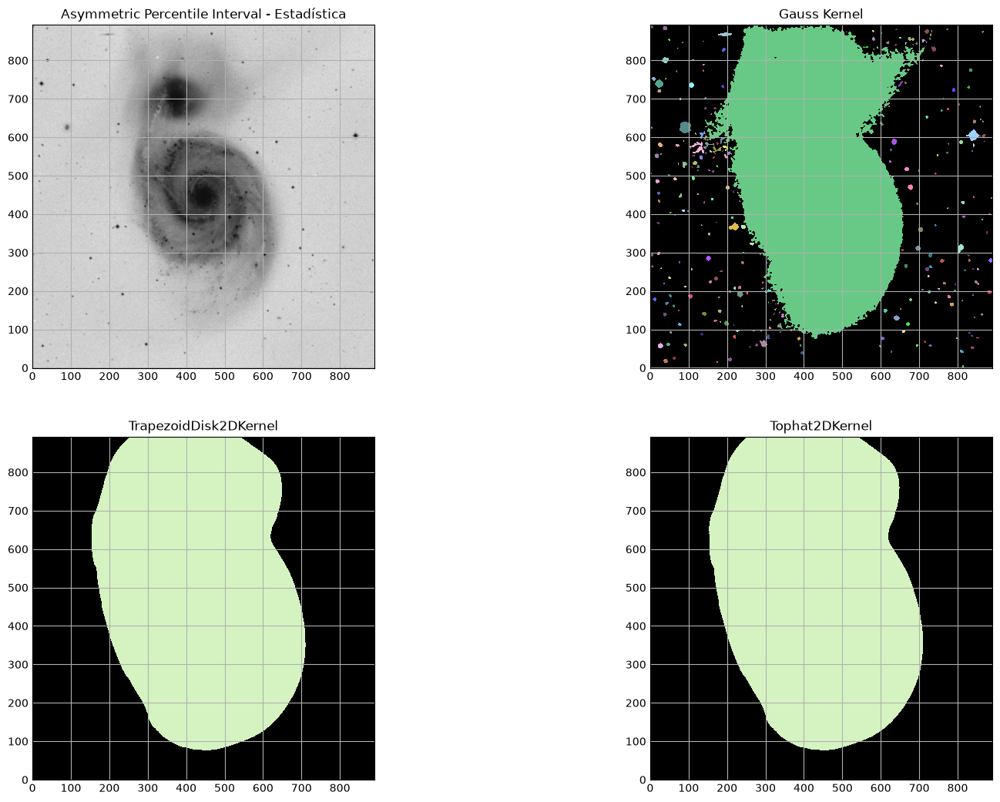

In [25]:
#convolusionamos la data
convolve_Gauss = convolve(arr_cielo_med, g2dK)
convolve_TD = convolve(arr_cielo_med, TD2dK)
convolve_Tophat = convolve(arr_cielo_med, T2dK)

#detecta sources
avg_u, med_u, std_u = sigma_clipped_stats(convolve_Gauss, sigma=3, maxiters=10)
umbral = detect_threshold(convolve_Gauss,n_sigma=1.5, error= std_u)
#segmento la imágen
seg_gauss = detect_sources(data=convolve_Gauss, threshold=umbral, n_pixels=10, connectivity=8)
seg_td = detect_sources(data=convolve_TD, threshold=umbral, n_pixels=10, connectivity=8)
seg_toph = detect_sources(data=convolve_Tophat, threshold=umbral, n_pixels=10, connectivity=8)
#grafico la segmentación de la galaxia
fig, axs = plt.subplots(nrows=2,ncols=2,figsize=(15,10))
axs[0,0].imshow(arr_cielo_med, origin='lower', cmap="Greys", norm = norm_minmax_est)#norm_aprint_est
axs[0,0].set_title('Asymmetric Percentile Interval - Estadística')
seg_gauss.imshow(ax=axs[0,1])
axs[0,1].set_title('Gauss Kernel')
seg_td.imshow(ax=axs[1,0])
axs[1,0].set_title('TrapezoidDisk2DKernel')
seg_toph.imshow(ax=axs[1,1])
axs[1,1].set_title('Tophat2DKernel')

In [26]:
avg_u, med_u, std_u

(np.float32(-20.48641), np.float32(-30.138222), np.float32(162.27129))

***Limpieza de estrellas espurias***

In [27]:
#1. generar una boolean mask para apagar la galaxia
arr_etiquetas= seg_gauss.data.ravel()
arr_lbl= np.bincount(arr_etiquetas)
arr_lbl[0]=0
id_galaxia=(np.argmax(arr_lbl))
bm_galaxia = seg_gauss.data == id_galaxia

In [28]:
#2. usar DAOStarFinder para detectar las estrellas latosas
daostar = DAOStarFinder(threshold=std_u*0.05, fwhm=2.5)
estrellas = daostar(convolve_Gauss-std_u)
for col in estrellas.colnames:
    if col not in ('id','n_pixels'): estrellas[col].info.format ='%.2f'
estrellas

id,x_centroid,y_centroid,sharpness,roundness1,roundness2,n_pixels,peak,flux,mag,daofind_mag
int64,float64,float64,float64,float32,float64,int64,float32,float32,float32,float64
1,52.79,1.17,0.45,0.23,0.82,25,-107.47,-3229.86,nan,-1.35
2,383.11,2.50,0.46,-0.19,0.56,25,-196.80,-6372.66,nan,-2.36
3,472.27,-0.34,0.46,-0.80,0.28,25,-224.95,-6598.95,nan,-1.94
4,643.37,1.63,0.46,-0.58,0.16,25,-93.37,-2888.37,nan,-1.35
5,658.92,1.91,0.47,-0.23,-0.32,25,-109.58,-3467.76,nan,-1.58
6,672.94,1.56,0.47,-0.05,-0.03,25,-74.96,-2432.11,nan,-1.28
7,684.23,-0.23,0.46,0.29,0.13,25,-63.88,-2596.55,nan,-1.96
8,777.46,2.16,0.45,-0.21,0.20,25,52.82,252.50,-6.01,-2.01
9,5.16,1.99,0.46,0.00,0.70,25,-94.37,-3231.25,nan,-1.81


 ...]

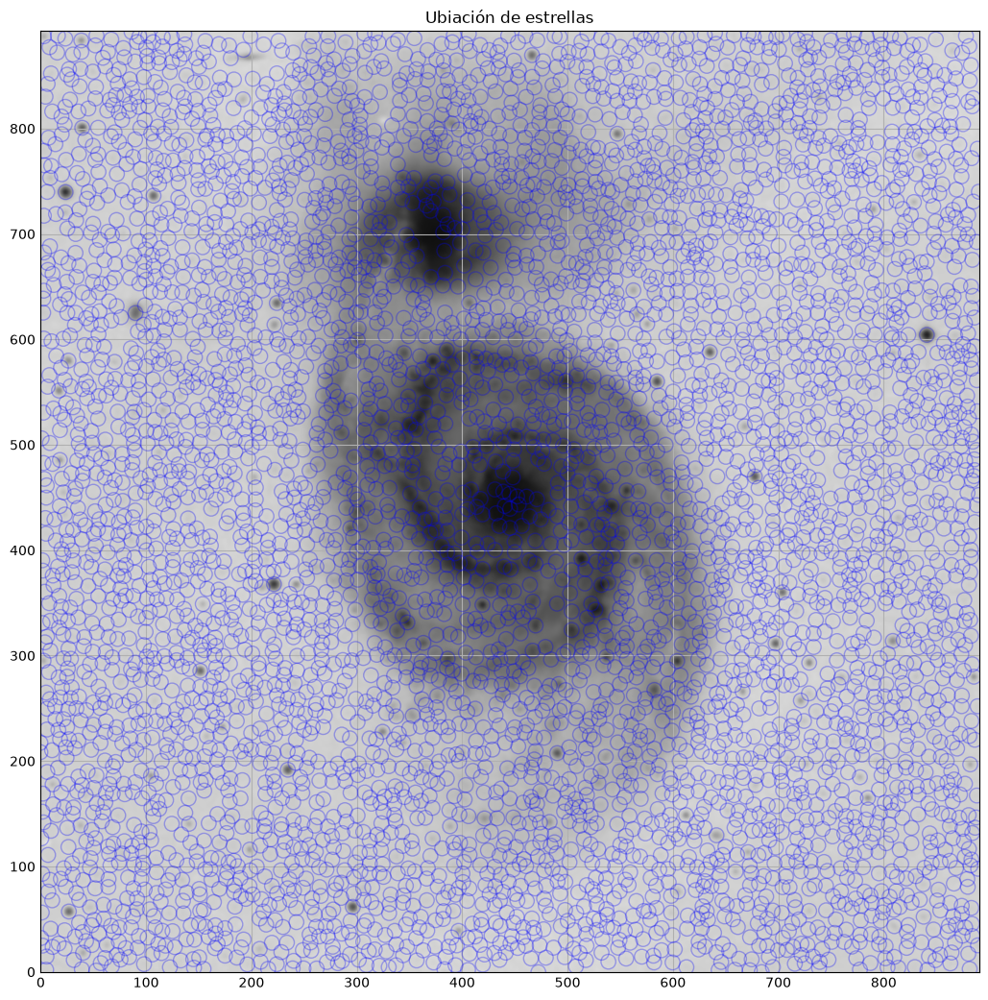

In [29]:
#3. con la tabla de resultante del anterior, enmarcar en un radio 7 px las estrellas
ubi_estrella = np.transpose((estrellas['x_centroid'], estrellas['y_centroid']))
circulo = CircularAperture(positions=ubi_estrella, r=7)

ax= plt.figure(figsize=(10,10)).add_subplot(title = 'Ubiación de estrellas')
ax.imshow(convolve_Gauss, cmap='Greys', origin='lower', norm = norm_minmax_est)
circulo.plot(color='blue', lw=1, alpha=0.3)

 ...]

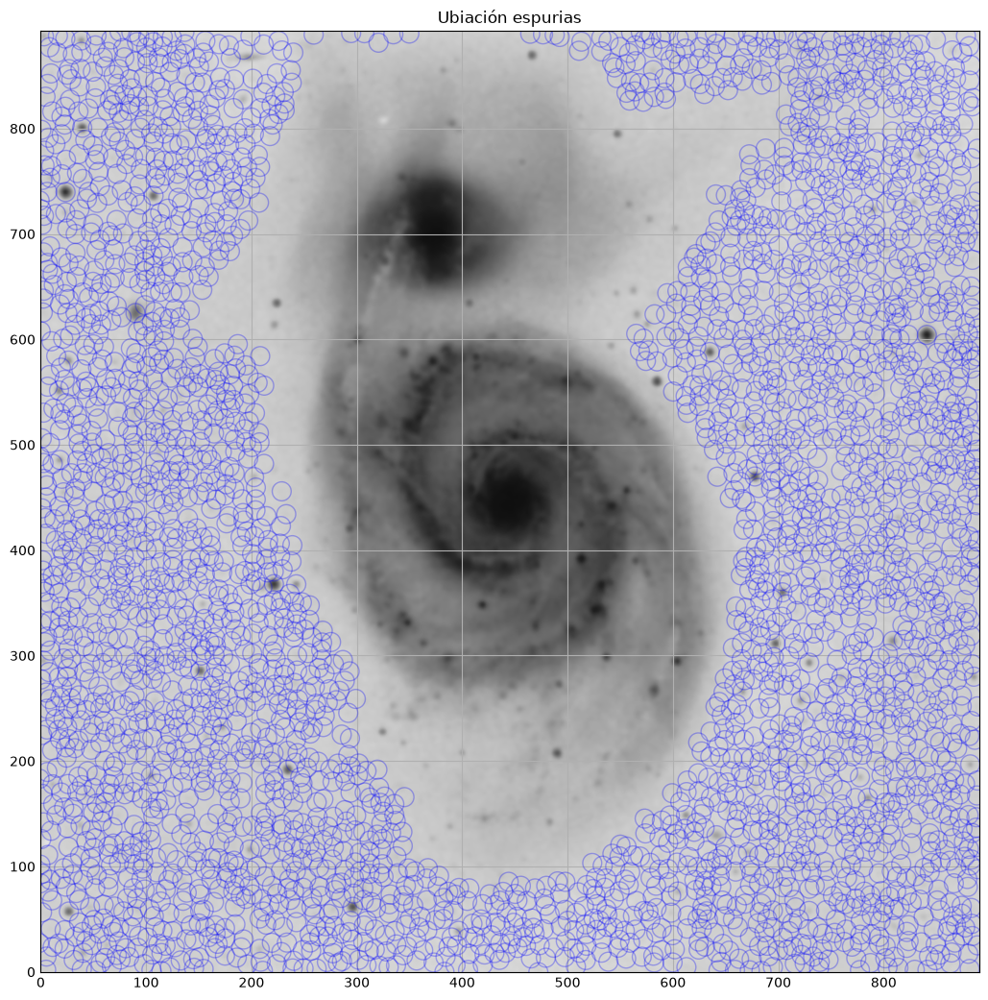

In [30]:
espurias = daostar(data=convolve_Gauss, mask=bm_galaxia)
pxX= espurias['xcentroid']
pxY= espurias['ycentroid']

ubi_esp = np.transpose((pxX,pxY))
cir_espurias = CircularAperture(positions=ubi_esp, r=9)

ax= plt.figure(figsize=(10,10)).add_subplot(title = 'Ubiación espurias')
ax.imshow(convolve_Gauss, cmap='Greys', origin='lower', norm = norm_minmax_est)
cir_espurias.plot(color='blue', lw=1, alpha=0.3)


In [31]:
print(convolve_Gauss.shape)
print(seg_gauss.data.shape)

(893, 891)
(893, 891)


In [32]:
avg_bkg, med_bkg, std_bkg = sigma_clipped_stats(bkg.background_rms, sigma=3, maxiters=10) 
print(f'''Datos del background numpy:
STD:{np.std(bkg.background)}
Med:{np.median(bkg.background)}
Mean:{np.mean(bkg.background)}
Datos con sigma clipped background:
STD:{std_bkg}
Med:{med_bkg}
Mean:{avg_bkg}
''')

Datos del background numpy:
STD:153.48419189453125
Med:4761.994140625
Mean:4670.3310546875
Datos con sigma clipped background:
STD:77.53924560546875
Med:375.4566345214844
Mean:330.087890625



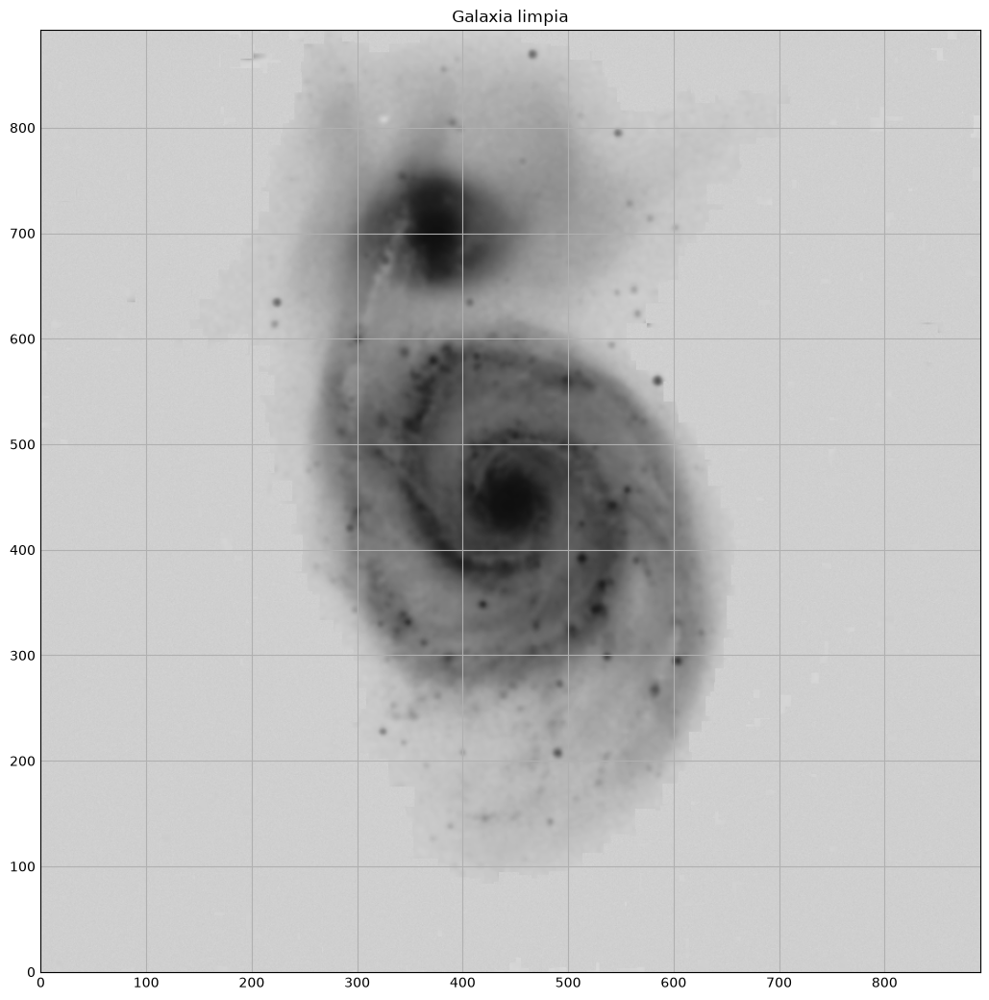

In [33]:
#1. copiar el array convolve_Gauss a arr_galaxia
arr_galaxia = np.copy(a=convolve_Gauss)
#2. obtener la lista de las coordenadas de los puntos azules
mascara=cir_espurias.to_mask(method='exact')
#3. dentro del for obtener las coordenadas Y,X del paso 2
for m in mascara:
    cord, _ = m.get_overlap_slices(shape=convolve_Gauss.shape)
    cordY, cordX = cord
    dimY = cordY.stop-cordY.start
    dimX = cordX.stop-cordX.start
    #4. hacer un arreglo de numpy con las cordenadas del paso 3 con media de 0 y std de std_u
    arr_Gauss = np.random.normal(loc=0, scale=std_bkg, size=(dimY,dimX))
    #5. poner ése arreglo en las mismas coordenadas de arr_galaxia
    arr_galaxia[cordY.start:cordY.stop,cordX.start:cordX.stop]=arr_Gauss
#6. graficar nueva imagen de la galaxia
ax= plt.figure(figsize=(10,10)).add_subplot(title = 'Galaxia limpia')
ax.imshow(arr_galaxia, cmap='Greys', origin='lower', norm = norm_minmax_est)

***Obtención de la silueta***

El pipeline se realiza de la siguiente manera:

1. Utilizar snake para detectar el borde de la galaxia
2. Ajustar snake al hola de la máscara
3. Hacer la máscara binaria: Fondo 0 y toda la galaxia 1
4. Calcular el bounding box

**Construcción de la elipse**

1. Construir los puntos de la elipse: Generas tu secuencia lineal de ángulos desde 0-2PI con los nodos.
2. Aplicar la asimetría de los radios:

    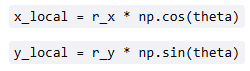
3. Hacer la matríz de rotación e inyectar el centro de la galaxia:

    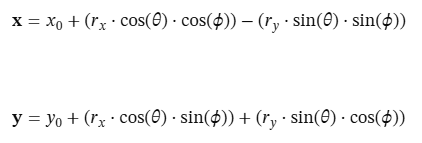
4. Graficar con active countour

In [34]:
#ubicación del centro de la galaxia
cent_mean = np.mean(np.argwhere(bm_galaxia!=0), axis=0)
cent_med = np.median(np.argwhere(bm_galaxia!=0), axis=0)#la mediana va a separar las estrellas espurias que pudieron permanecer debido a la cercanía con el halo; ej: [500,600:500:600]

print(f'centro prom:{cent_mean}|centro_med:{cent_med}')

centro prom:[514.12594619 431.43313022]|centro_med:[516. 433.]


In [35]:
#dimensionar los diámetros de la elipse
com_h = np.any(bm_galaxia,axis=1) #Y
com_v = np.any(bm_galaxia,axis=0) #X
ymax=np.max(np.where(com_h==1))
ymin= np.min(np.where(com_h==1))
xmax=np.max(np.where(com_v==1))
xmin= np.min(np.where(com_v==1))
print(f'ymin:{ymin}|ymax:{ymax}|xmin:{xmin}|xmax:{xmax}')

ymin:75|ymax:891|xmin:143|xmax:714


In [36]:
#obtengo el ángulo de rotación de la galaxia
rp = regionprops(np.astype(bm_galaxia,int))
ang_phi = rp[0].orientation
centro = rp[0].centroid
ymin, xmin,ymax,xmax = rp[0].bbox
print(f'ymin:{ymin}|ymax:{ymax}|xmin:{xmin}|xmax:{xmax}|phi:{ang_phi}')

ymin:75|ymax:892|xmin:143|xmax:715|phi:-0.13616215218605743


In [37]:
#obtengo los radios, dependiendo del proceso a ejecutar se calculan los radios
rY= ((ymax-ymin)/2)*1.1
rX=((xmax-xmin)/2)*1.1
rY,rX

(449.35, 314.6)

In [38]:
#1. genero el arreglo que va de 0-2PI - esto es THETA
#cálculo de los puntos: el número de puntos lo obtendré con la hipotenusa
arr_theta = np.linspace(0,2*np.pi, num=300)
arr_theta.shape

(300,)

In [39]:
#asímetría de la elipse
x_punto = rX * np.cos(arr_theta)
y_punto = rY * np.sin(arr_theta)

In [40]:
#la rotación de la galaxia
x = cent_med[1]+(x_punto*np.cos(ang_phi))-(y_punto*np.sin(ang_phi))
y = cent_med[0]+(x_punto*np.sin(ang_phi))+(y_punto*np.cos(ang_phi))
#junto los dos arreglos para tener 1 solo array
elipse = np.clip(np.array([y,x]).T,0,arr_galaxia.shape[0])
elipse.shape

(300, 2)

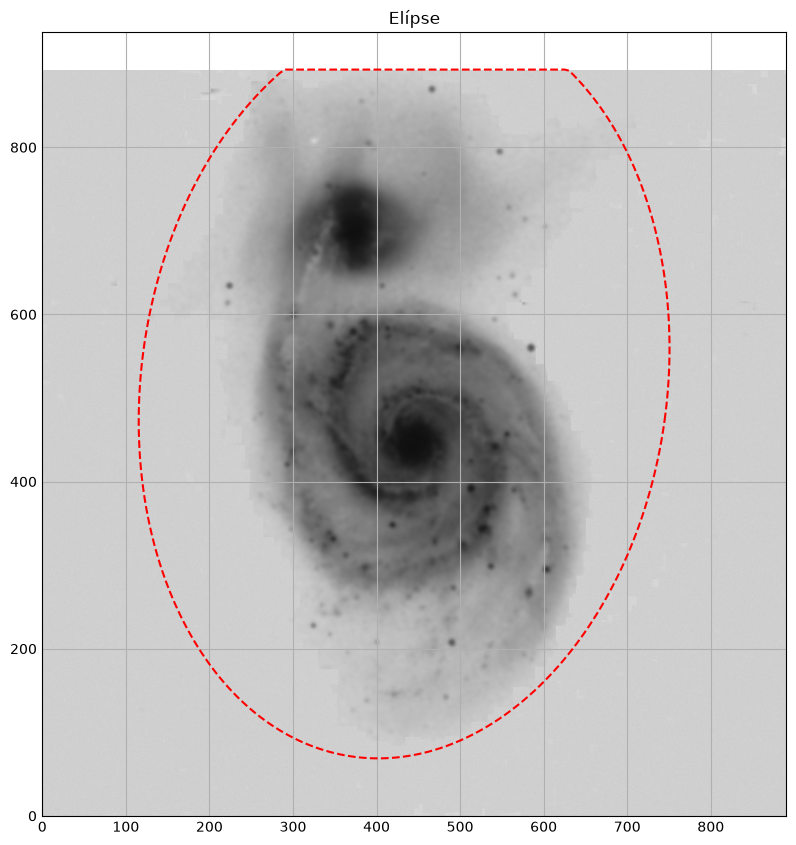

In [41]:
ax= plt.figure(figsize=(8,8)).add_subplot(title = 'Elípse')
ax.imshow(arr_galaxia, cmap='Greys', origin='lower', norm = norm_minmax_est)
ax.plot(elipse[:,1],elipse[:,0],'--r')

| Nº | Argumento | Nombre Conceptual    | Descripción Técnica  | Efecto si es Alto     | Efecto si es Bajo      |
|----|------------------------|----------------------------------|-----------------------------------------------------------------------------------------------------------|------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------|
| 1  | image| Imagen Base| Matriz de intensidades donde evoluciona el snake. Debe estar normalizada y sin ruido estelar. | El snake detecta bien bordes y gradientes.     | El snake se pierde, se queda dentro o ignora el halo.       |
| 2  | snake      | Curva Inicial (Semilla)          | Conjunto de coordenadas (x,y) que define la forma inicial.           | Si está bien colocada, la curva converge rápido.           | Si está mal colocada, la curva colapsa o se queda atrapada.  |
| 3  | alpha      | Tensión  | Penaliza cambios en la primera derivada. **Controla qué tan recta quiere ser la curva.**         | La curva se vuelve recta y rígida.  | La curva se vuelve flexible y puede adaptarse al halo.      |
| 4  | beta       | Rigidez  | Penaliza cambios en la segunda derivada. **Controla la suavidad de la curvatura.**   | La curva se vuelve muy suave y rígida.         | La curva se vuelve elástica y puede doblarse para seguir contornos complejos.       |
| 5  | gamma      | Paso de Integración  | Controla la **velocidad de actualización por iteración**. No afecta la forma final, solo la dinámica.        | Avanza rápido, puede saltarse bordes.          | Avanza lento, converge despacio.    |
| 6  | boundary_condition     | Condición de Frontera | Define si la curva es cerrada, fija o libre. Para galaxias debe ser “periodic”.  | Mantiene la curva cerrada correctamente.       | Puede romper la continuidad del contorno.       |
| 7  | max_px_move | Desplazamiento Máximo | Límite de movimiento por iteración para cada punto del snake.        | La curva puede saltarse el halo.    | La curva no puede escapar del interior.         |
| 8  | max_num_iter           | Iteraciones Máximas  | Número máximo de actualizaciones del snake.   | Permite alcanzar bordes difusos lejanos.       | La curva se detiene antes de llegar al halo.    |
| 9  | w_line     | Peso de Energía de Línea         | **Atrae la curva hacia intensidades específicas** (zonas brillantes u oscuras).      | Se queda dentro del flujo brillante del núcleo. | Ignora intensidades y depende más del borde.    |
| 10 | w_edge     | Peso de Energía de Borde         | **Atrae la curva hacia gradientes fuertes (bordes del halo).**           | La curva se pega al halo externo.   | Ignora bordes y se queda dentro.    |
| 11 | convergence | Criterio de Convergencia         | Umbral mínimo de **movimiento promedio entre iteraciones** para detener el algoritmo. | Converge demasiado pronto, sin alcanzar el halo.           | Itera más tiempo, puede alcanzar la frontera difusa.        |


In [42]:
avg_glx, med_glx, std_glx = sigma_clipped_stats(arr_galaxia, sigma=3, maxiters=10) 
print(f'''Datos del background numpy:
STD:{np.std(arr_galaxia)}
Med:{np.median(arr_galaxia)}
Mean:{np.mean(arr_galaxia)}
Datos con sigma clipped background:
STD:{std_glx}
Med:{med_glx}
Mean:{avg_glx}
''')

Datos del background numpy:
STD:3195.170166015625
Med:60.05047607421875
Mean:1513.8494873046875
Datos con sigma clipped background:
STD:84.65045928955078
Med:1.8234846591949463
Mean:4.077776908874512



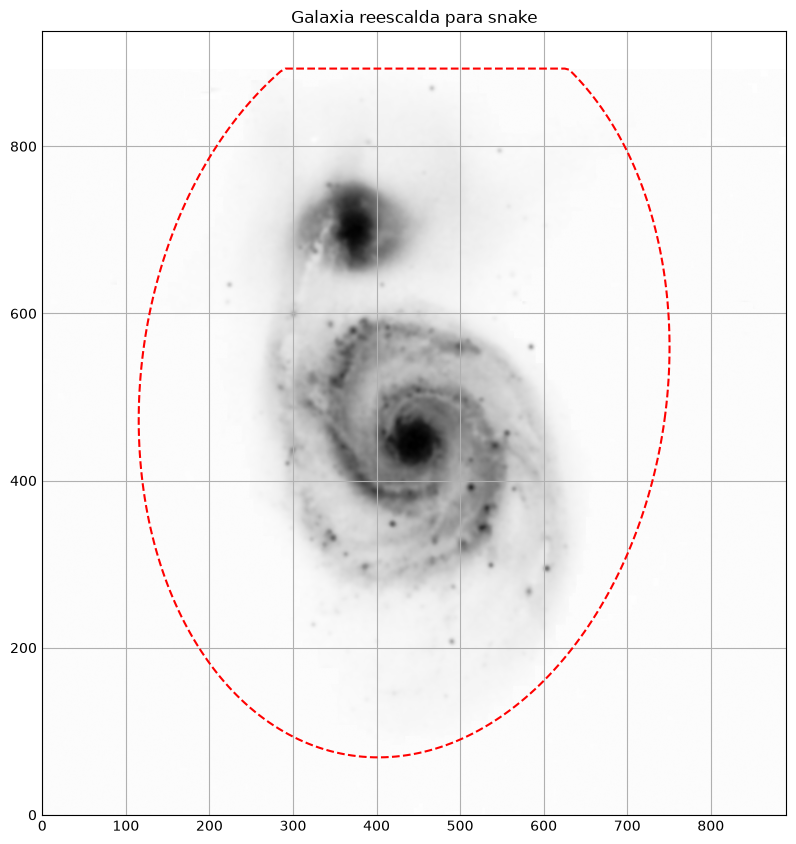

In [43]:
glaxia_rescaled = rescale_intensity(arr_galaxia)
ax= plt.figure(figsize=(8,8)).add_subplot(title = 'Galaxia reescalda para snake')
ax.imshow(glaxia_rescaled, cmap='Greys', origin='lower')
ax.plot(elipse[:,1],elipse[:,0],'--r')

- Eso es solo la razón de aspecto (elongación), no una medida de suavidad. 
    - Problemas:
        - No escala con el tamaño de la galaxia: una galaxia pequeña y una enorme pueden tener la misma razón.
        - El valor suele ser cercano a 1, así que beta termina siendo casi constante y poco significativo.
    - No está ligado a “qué tan rígido” quieres el snake, solo a “qué tan alargada” es la caja.

- Para que beta tenga sentido:
    - Debe ser un escalar que crezca con el tamaño del bounding box, no solo con su forma.
    - Algo del estilo “cuanto más grande la galaxia, más suave la curva”.

- Intuición mínima que sí tiene sentido:
    - diagonal del bounding box: 

    np.sqr((𝑥𝑚𝑎𝑥−𝑥𝑚𝑖𝑛)2+(𝑦𝑚𝑎𝑥−𝑦𝑚𝑖𝑛)2)

    - simplemente promedio de ancho y alto: 
    
    ((𝑥𝑚𝑎𝑥−𝑥𝑚𝑖𝑛)+(𝑦𝑚𝑎𝑥−𝑦𝑚𝑖𝑛))/2

In [44]:
beta_sqr = np.sqrt((xmax-xmin)**2+(ymax-ymin)**2)
beta_prom = ((xmax-xmin)+(ymax-ymin))/2
print(f'sqrt:{beta_sqr}|beta_prom:{beta_prom}')

sqrt:997.3329434045584|beta_prom:694.5


Text(0.5, 1.0, 'Snake SCS ß Prom')

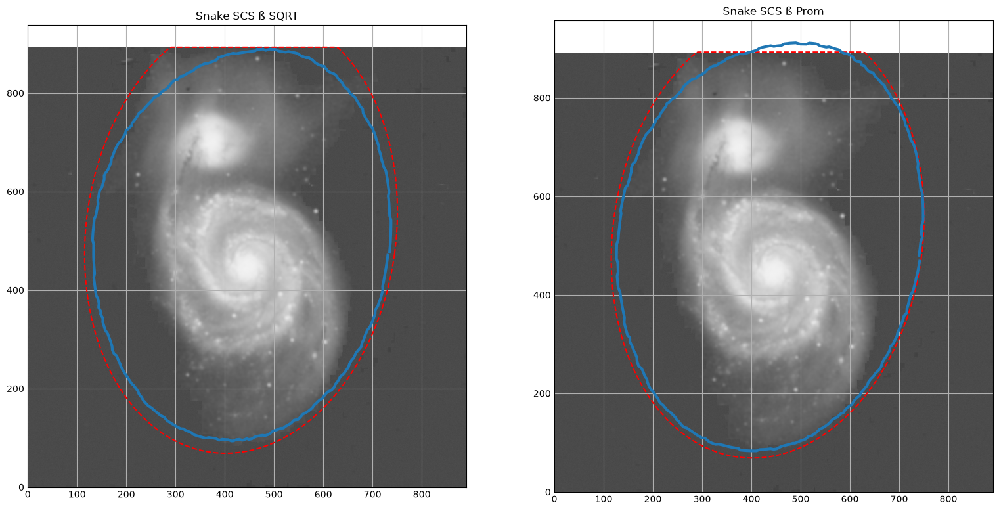

In [45]:
snake_sigma_sqr = active_contour(
    image=glaxia_rescaled,
    snake=elipse,
    alpha=1,#5
    beta=beta_sqr,
    gamma=1,
    w_edge=std_glx*3,
    max_px_move=3,
    w_line=-med_glx*6)

snake_sigma_prom = active_contour(
    image=glaxia_rescaled,
    snake=elipse,
    alpha=1,#5
    beta=beta_prom,
    gamma=1,
    w_edge=std_glx*3,
    max_px_move=3,
    w_line=-med_glx*6)

fig, axs = plt.subplots(nrows=1,ncols=2,figsize=(15,10))
axs[0].imshow(arr_galaxia, cmap='grey', origin='lower', norm=norm_minmax_est)
axs[0].plot(elipse[:,1],elipse[:,0],'--r')
axs[0].plot(snake_sigma_sqr[:, 1], snake_sigma_sqr[:, 0], '-', lw=3)
axs[0].set_title('Snake SCS ß SQRT')
axs[1].imshow(arr_galaxia, cmap='grey', origin='lower', norm=norm_minmax_est)
axs[1].plot(elipse[:,1],elipse[:,0],'--r')
axs[1].plot(snake_sigma_prom[:, 1], snake_sigma_prom[:, 0], '-', lw=3)
axs[1].set_title('Snake SCS ß Prom')

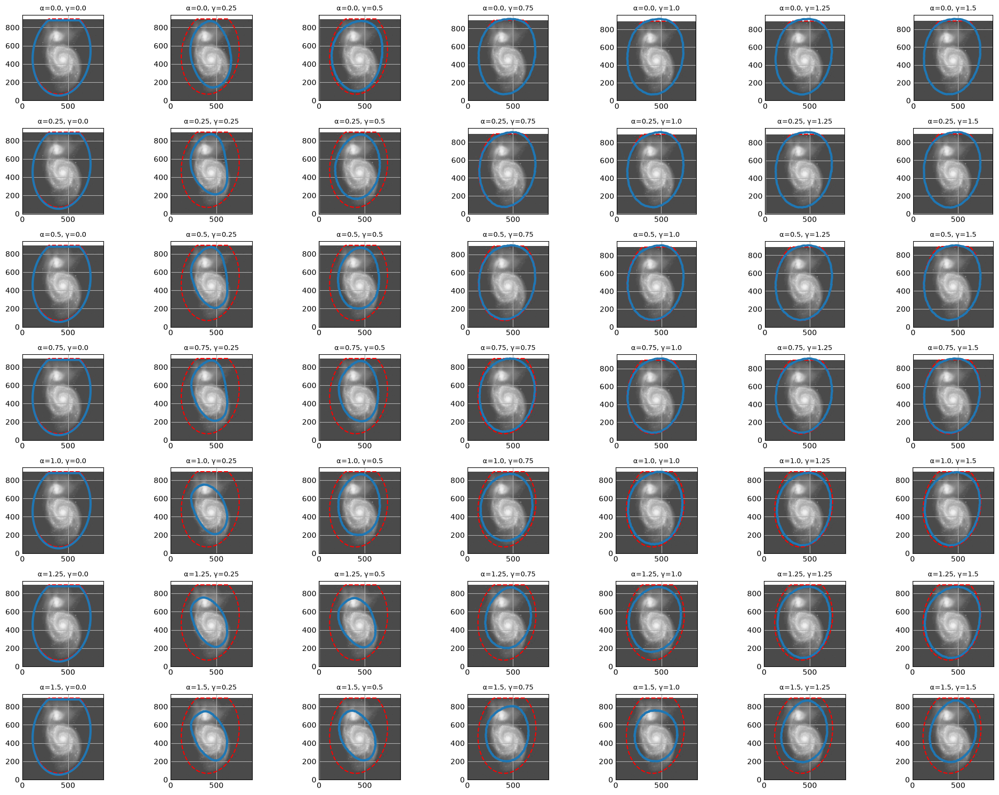

In [46]:
#aplico brut force para poder detectar cuál es el mejor valor para alpha y gamma
p_alpha = np.arange(start=0, stop=1.60,step=0.25)
p_gamma = np.arange(start=0, stop=1.60,step=0.25)
combinaciones =[(a,g) for a in p_alpha for g in p_gamma]

fig, axs = plt.subplots(nrows=7, ncols=7, figsize=(20,15))
axs = axs.ravel()
for c, ax in zip(combinaciones,axs):
    a=c[0]
    g=c[1]
    snake_brut = active_contour(
        image=glaxia_rescaled,
        snake=elipse,
        alpha=a,#5
        beta=beta_sqr,
        gamma=g,
        w_edge=std_glx*3,
        max_px_move=3,
        w_line=-med_glx*6
    )

    ax.imshow(arr_galaxia, cmap='grey', origin='lower', norm=norm_minmax_est)
    ax.plot(elipse[:,1],elipse[:,0],'--r')
    ax.plot(snake_brut[:, 1], snake_brut[:, 0], '-', lw=3)
    ax.set_title(f'α={a}, γ={g}', fontsize=9)

plt.tight_layout()
plt.show()
        
    

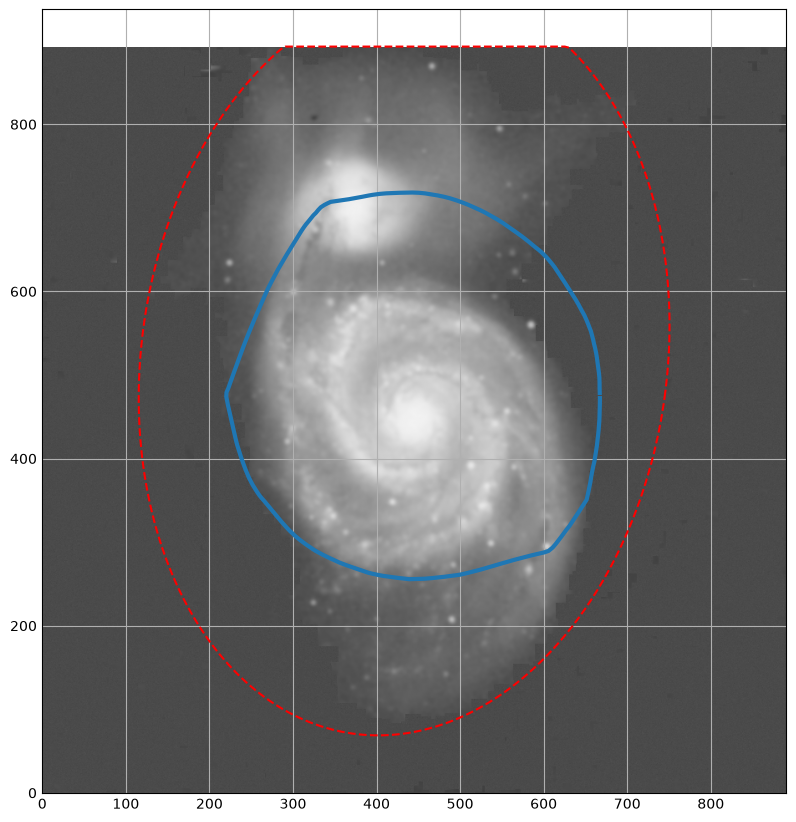

In [47]:
snake_sigma_sqr = active_contour(
    image=glaxia_rescaled,
    snake=elipse,
    alpha=0.25,#5
    beta=0,
    gamma=0.25,
    w_edge=-10,
    max_px_move=1,
    w_line=0)

plt.figure(figsize=(8,8))
plt.imshow(arr_galaxia, cmap='grey', origin='lower', norm=norm_minmax_est)
plt.plot(elipse[:,1],elipse[:,0],'--r')
plt.plot(snake_sigma_sqr[:, 1], snake_sigma_sqr[:, 0], '-', lw=3)
#plt.title(f'beta:{b}')